# Cortical properties of structurally connected brain regions

In this notebook, the goal is to describe the cortical properties of brain regions that are structurally connected via white matter tracts. This is a preliminary version!
The notebook goes through the following steps: 

1. Load tract-to-region mapping: here, we are loading probabilistic tract-to-region maps publicly released by [Yeh 2022, Nature Methods](https://www.nature.com/articles/s41467-022-32595-4). This map is used to determine, for each white matter tract, which brain regions it is most likely connected to. 

2. Parcellate surface maps: selected cortical properties made publicly available as part of the [Neuromaps Pyhon package](https://netneurolab.github.io/neuromaps/).

3. Test for statistical significance: we'll test whether the cortical properties of structurally connected brain regions are significantly different compared to non-connected brain regions. 

In [11]:
# let's import the needed packages
import pandas as pd
import re
from neuromaps.datasets import fetch_fslr, fetch_annotation
from neuromaps import datasets, images, nulls, resampling, stats, transforms, parcellate
from surfplot import Plot
from neuromaps.parcellate import Parcellater, _gifti_to_array
from neuromaps.resampling import resample_images
from neuromaps.images import dlabel_to_gifti
import neuromaps
import nibabel as nib
import os
import numpy as np
import mayavi
from PIL import Image
import hcp_utils as hcp
import nilearn.plotting as plotting
import tractmaps_utils
import warnings
warnings.filterwarnings('ignore')

## 1. Load tract-to-region mapping

Yeh's tract to brain region mapping system (see [link](https://static-content.springer.com/esm/art%3A10.1038%2Fs41467-022-32595-4/MediaObjects/41467_2022_32595_MOESM4_ESM.zip) is used to determine, for each white matter tract, which brain regions it is most likely connected to. 


Note that we'll be using the Glasser 360, also called HCP-MMP parcellation, as this is the most fine-grained parcellation (180 regions per hemisphere) provided in Yeh 2022 (other parcellations included Brodmann and Kleist, which have 39 and 49 regions, respectively).

These regions are then displayed for some of the main white matter tracts. 


A couple of notes about this tract-to-region matrix: 

* It contains population probabilities for each tract-to-region connection. This probability essentially indicates to what extent each given tract-to-region connection exists in the included sample of 1065 individuals. Tract-to-region connections that occur in most individuals will have a high probability, whereas tract-to-region connections that are rare will have a low probability. 
* The matrix does not contain commissural tracts (crossing fibers related limitations), brainstem, subcortical or cerebellar connections (due to insufficient slice coverage, insufficient spatial resolution to generate reliable tracking results). 
* Tract-to-region probabilities have been computed based on an adult sample (HCP, ages 22-37). 
* The matrix will have NAs for left hemisphere brain regions connecting to right hemisphere tracts, and vice versa (as no commissural tracts are listed here). 

In [2]:
# load Frank's Glasser tract-to-region matrix
tracts_regs = pd.read_excel("./inputs/Yeh_2022_fig5_Glasser.xlsx", skiprows = 1, usecols = range(0, 53))

# rename columns (tract names)
columns = {}
for colidx, colname in enumerate(tracts_regs.columns):
    if colidx == 0:
        columns[colname] = f'parcel_name'
    if 1 <= colidx <= 26:
        columns[colname] = f'{colname}_left'
    elif colidx >= 27:
        columns[colname] = colname[:colname.index(".")] + "_right"
        
tracts_regs.rename(columns = columns, inplace = True)

# separate into L and R dataframes, rename parcel.name values
lh_tracts_regs = tracts_regs.filter(regex='^(parcel.name|.*_left$)')
rh_tracts_regs = tracts_regs.filter(regex='^(parcel.name|.*_right$)')  

lh_tracts_regs['LR'] = 'L'
lh_tracts_regs['parcel_name'] = lh_tracts_regs['LR'] + '_' + lh_tracts_regs['parcel_name'].astype(str)
rh_tracts_regs['LR'] = 'R'
rh_tracts_regs['parcel_name'] = rh_tracts_regs['LR'] + '_' + rh_tracts_regs['parcel_name'].astype(str) 

# aggregate the two dataframes back again now that L and R regions are assigned
tracts_regs = pd.concat([lh_tracts_regs, rh_tracts_regs])
tracts_regs.shape

(360, 54)

In [3]:
tracts_regs

,parcel_name,FAT_left,AF_left,PTAT_left,MdLF_left,SLF_III_left,SLF_II_left,SLF_I_left,C_FP_left,C_R_left,...,CST_right,CBT_right,CStr_A_right,CStr_P_right,CStr_S_right,CTh_A_right,CTh_P_right,CTh_S_right,OR_right,F_right
0,L_TGd,0.0,0.041315,0.0,0.259470,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,L_STSva,0.0,0.830047,0.0,0.641098,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,L_TE1a,0.0,0.937089,0.0,0.644886,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,L_STSda,0.0,0.590610,0.0,0.782197,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,L_STGa,0.0,0.000939,0.0,0.719697,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,R_AVI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.661033,0.0,0.005634,0.083568,0.0,0.0,0.0,0.0
176,R_a10p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.000000,0.0,0.000000,0.985915,0.0,0.0,0.0,0.0
177,R_a47r,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.000000,0.0,0.000000,0.992488,0.0,0.0,0.0,0.0
178,R_11l,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.973709,0.0,0.000000,0.485446,0.0,0.0,0.0,0.0


### 1.1. Load Glasser 360 region ID file

Next, we need to know the region ID (number) corresponding to every brain region in the Glasser 360 (also called HCP-MMP) parcellation. We'll need these numbers in order to visualize the right parcels corresponding to each white matter tract. 

This list has been taken from: [here](https://neuroimaging-core-docs.readthedocs.io/en/latest/pages/atlases.html#how-to-download-and-install-additional-fsl-atlases), which lists several useful files provided by the original Glasser parcellation paper. Specifically, we'll use this csv: `HCP-MMP1_UniqueRegionList.csv`. Note that in this csv, `7Pl_L` and `7PL_R` need to be changed to `7PL_L` and `7PL_R` (so basically capitalizing the `L`) so that the merge with tract-to-region data works for these regions. 

Original Glasser paper: Glasser, M. F., Coalson, T. S., Robinson, E. C., Hacker, C. D., Harwell, J., Yacoub, E., et al. (2016). A multi-modal parcellation of human cerebral cortex. Nature, 1–11. http://doi.org/10.1038/nature18933

In [4]:
# get Glasser region IDs and corresponding region labels (transform dictionary into dataframe)
glasser_ids = pd.DataFrame({'regionName': list(hcp.mmp.labels.values()), 
                            'regionID': list(hcp.mmp.labels.keys())})

# keep only cortical regions (361-380 are subcortical)
glasser_ids = glasser_ids[glasser_ids['regionID'] <= 360] 

# add long region labels (full description based on supplemental files of the Glasser 2016 paper and made available at link above)
glasser_longnames = pd.read_csv('./inputs/HCP-MMP1_UniqueRegionList.csv')

# dropping region IDs here as they are non-continuous (goes from L 180 to R 201)
glasser_longnames.drop(columns = ['Cortex_ID', 'x-cog', 'y-cog', 'z-cog', 'volmm', 'Lobe', 'regionID', 'LR'], inplace = True) 

# place the hemisphere (L_ or R_) as a prefix, not a suffix in region labels
glasser_longnames['regionName'] = glasser_longnames['regionName'].apply(lambda x: f"{x[-1]}_{x[:-2]}")

# merge the Glasser regionIDs, labels, and long region names
glasser_ids = pd.merge(glasser_ids, glasser_longnames, on = 'regionName', how = 'left')

# merge with the tract-to-regions data
tracts_regs_ids = pd.merge(tracts_regs, glasser_ids, left_on = 'parcel_name', right_on = 'regionName', how = 'left')
tracts_regs_ids.drop(columns = ['regionName'], inplace = True)

In [5]:
# the tract-to-region dataframe now has additional columns containing Glasser region IDs
tracts_regs_ids

,parcel_name,FAT_left,AF_left,PTAT_left,MdLF_left,SLF_III_left,SLF_II_left,SLF_I_left,C_FP_left,C_R_left,...,CTh_A_right,CTh_P_right,CTh_S_right,OR_right,F_right,regionID,regionLongName,regionIdLabel,region,cortex
0,L_TGd,0.0,0.041315,0.0,0.259470,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,131,Area_TG_dorsal_L,131_L,TGd,Lateral_Temporal
1,L_STSva,0.0,0.830047,0.0,0.641098,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,176,Area_STSv_anterior_L,176_L,STSva,Auditory_Association
2,L_TE1a,0.0,0.937089,0.0,0.644886,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,132,Area_TE1_anterior_L,132_L,TE1a,Lateral_Temporal
3,L_STSda,0.0,0.590610,0.0,0.782197,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,128,Area_STSd_anterior_L,128_L,STSda,Auditory_Association
4,L_STGa,0.0,0.000939,0.0,0.719697,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,123,Area_STGa_L,123_L,STGa,Auditory_Association
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,R_AVI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.083568,0.0,0.0,0.0,0.0,291,Anterior_Ventral_Insular_Area_R,311_R,AVI,Insular_and_Frontal_Opercular
356,R_a10p,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.985915,0.0,0.0,0.0,0.0,269,Area_anterior_10p_R,289_R,a10p,Orbital_and_Polar_Frontal
357,R_a47r,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.992488,0.0,0.0,0.0,0.0,257,Area_anterior_47r_R,277_R,a47r,Inferior_Frontal
358,R_11l,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.485446,0.0,0.0,0.0,0.0,271,Area_11l_R,291_R,11l,Orbital_and_Polar_Frontal


In [6]:
# save dataframe
tracts_regs_ids.sort_values(by = 'regionID', inplace = True)
region_col = tracts_regs_ids.pop('regionID')
tracts_regs_ids.insert(0, 'regionID', region_col)

# create outputs folder if doesn't yet exist
outputs_folder = './outputs'
if not os.path.exists(outputs_folder):
    os.makedirs(outputs_folder)
    print(f"Folder '{outputs_folder}' created.")
else:
    print(f"Folder '{outputs_folder}' already exists.")
    
tracts_regs_ids.to_csv(f'{outputs_folder}/tracts_regs_Glasser.csv', header = True, index = False)

Folder './outputs' already exists.


## 2. Parcellate surface maps

### 2.1. Load and display Glasser 360 (HCP-MMP) parcellation

Let's start by loading the Glasser 360 parcellation, which corresponds to the HCP-MMP parcellation used in Yeh 2022. This parcellation contains 360 brain regions. We'll then display this parcellation using `nilearn`. The Glasser 360 parcellation is obtained from the HCP utils Python Package - [see documentation here](https://rmldj.github.io/hcp-utils/). 

A cool resource for Python-based neuroimaging tutorials (useful also for working with parcellations):
https://dartbrains.org/content/Parcellations.html

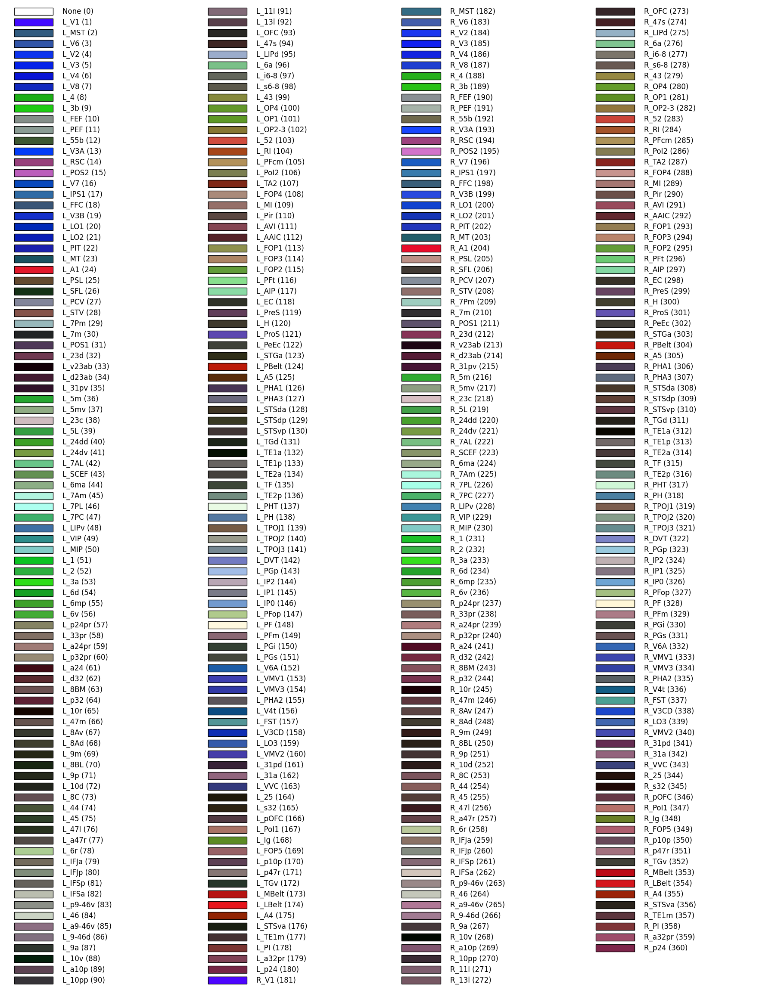

In [7]:
# view parcellation labels and their corresponding numerical ID
hcp.parcellation_labels(hcp.mmp)

# view Glasser parcellation
hcp.view_parcellation(hcp.mesh.inflated, hcp.mmp)

# view parcel numerical IDs
# hcp.mmp.ids

# view dictionary which maps the numerical id to the name of the region
# hcp.mmp.labels

### 2.2. Load selected surface maps and parcellate them into Glasser 360

The first step is to load some neuromaps cortical properties we're interested in. 

Let's load: 

* S-A axis ranks
* cortical thickness
* the first functional connectivity gradient
* intracortical myelination

In [12]:
# load maps of interest
sa_axis = fetch_annotation(source = 'sydnor2021', desc = 'SAaxis',
                                       space = 'fsLR', den = '32k')

thickness = fetch_annotation(source = 'hcps1200', desc = 'thickness',
                                       space = 'fsLR', den = '32k')

fc_pc1 = fetch_annotation(source = 'margulies2016', desc = 'fcgradient01',
                                       space = 'fsLR', den = '32k')

myelin = fetch_annotation(source = 'hcps1200', desc = 'myelinmap',
                                       space = 'fsLR', den = '32k')

Then, we'll need to parcellate these maps to get regionwise values of the above cortical properties within the Glasser parcellation, as that's the parcellation we have for the tract-to-region mapping.

In [249]:
# transform array of grayordinates (hcp.mmp.map_all) to the values on the vertices. 
# The unused vertices are filled with a constant (zero by default). Order is Left, Right hemisphere.
lh_glasser = hcp.left_cortex_data(hcp.mmp.map_all).astype(int)
rh_glasser = hcp.right_cortex_data(hcp.mmp.map_all).astype(int)

# select region labels
labels = list(hcp.mmp.labels.values())

# redefine the medial wall label to match one of the elements in PARCIGNORE (required for generating spin samples in the alexander_bloch nulls function)
# PARCIGNORE = ['unknown', 'corpuscallosum', 'Background+FreeSurfer_Defined_Medial_Wall','???', 'Unknown', 'Medial_wall', 'Medial wall', 'medial_wall']
labels[0] = 'medial_wall'

# select left and right hemisphere labels
lh_labels = labels[0:181] # the first 0-180 are unassigned (0) and 1-180 are lh labels
rh_labels = [labels[0]]  + labels[181:361] # the first (0) unassigned label and 181-360 are rh labels

# create giftis for left and right hemispheres
lh_glasser = images.construct_shape_gii(hcp.left_cortex_data(hcp.mmp.map_all), labels = lh_labels,
                                       intent = 'NIFTI_INTENT_LABEL')
rh_glasser = images.construct_shape_gii(hcp.right_cortex_data(hcp.mmp.map_all), labels = rh_labels,
                                       intent = 'NIFTI_INTENT_LABEL')

# glasser = images.relabel_gifti((lh_glasser, rh_glasser))
glasser = (lh_glasser, rh_glasser)

# create parcellater object
glasser_parc = Parcellater(glasser, 'fsLR').fit()
# glasser_parc.parcellation[0].darrays[0] #.data

# apply Glasser parcellation to surface maps of interest
sa_axis_glasser = glasser_parc.fit_transform(sa_axis, 'fsLR')
thickness_glasser = glasser_parc.fit_transform(thickness, 'fsLR')
fc_pc1_glasser = glasser_parc.fit_transform(fc_pc1, 'fsLR')
myelin_glasser = glasser_parc.fit_transform(myelin, 'fsLR')

# show dimensions of parcellated maps
print(sa_axis_glasser.shape, thickness_glasser.shape, fc_pc1_glasser.shape, myelin_glasser.shape)

(360,) (360,) (360,) (360,)


In [250]:
rotated_maps = nulls.alexander_bloch(myelin_glasser, atlas = 'fsLR', density = '32k',
                                n_perm = 100, seed = 1234, parcellation = glasser)

### 2.3. Visualize parcellated surface maps

Now that we've parcellated a few cortical properties into Glasser regions, let's visualize them! For that, we'll use the `view_surf` function from `nilearn` in combination with `hcp_utils` functions. 

Note: most plots have been commented out to reduce file size - just uncomment to run and visualize the brains!

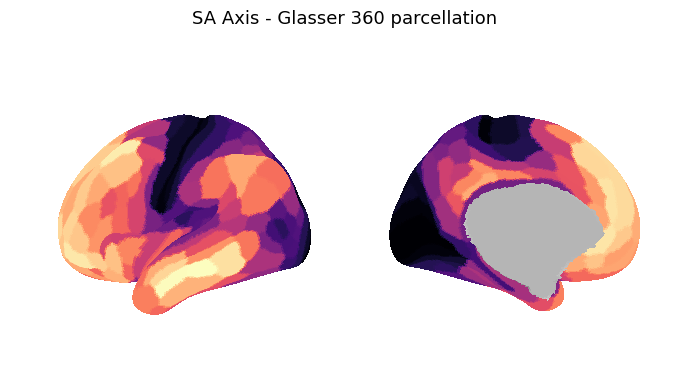

In [244]:
tractmaps_utils.plot_parc_map(brain_map = sa_axis_glasser, 
                              map_name = 'SA Axis', 
                              colors = 'magma', 
                              mode = 'static', 
                              hemisphere = 'left')

In [15]:
# visualize SA axis
# tractmaps_utils.plot_parc_map(brain_map = sa_axis_glasser, map_name = 'SA Axis', colors = 'magma')

In [16]:
# visualize cortical thickness
# tractmaps_utils.plot_parc_map(brain_map = thickness_glasser, map_name = 'Cortical Thickness', colors = 'viridis')

In [17]:
# visualize functional gradient, first PC
# tractmaps_utils.plot_parc_map(brain_map = fc_pc1_glasser, map_name = 'Functional Gradient PC1', colors = 'PiYG')

In [18]:
# visualize intracortical myelination
# tractmaps_utils.plot_parc_map(brain_map = myelin_glasser, map_name = 'Intracortical Myelin', colors = 'Spectral')

### 2.2. Visualize structurally connected brain regions - an example

Let's visualize the brain regions that each white matter tract connects to. 
For instance, let's see what regions are connected to the left Arcuate Fasciculus (AF).

In [19]:
# show brain regions connected to the AF in most people (>95% probability of connection)
left_AF_df = tracts_regs_ids.loc[tracts_regs_ids['AF_left'] > 0.95, ['parcel_name', 'regionLongName', 'cortex', 'regionID']]
print(f'Number of brain regions structurally connected to the left AF: {len(left_AF_df)}')
left_AF_df

Number of brain regions structurally connected to the left AF: 20


,parcel_name,regionLongName,cortex,regionID
124,L_4,Primary_Motor_Cortex_L,Somatosensory_and_Motor,8
112,L_PSL,PeriSylvian_Language_Area_L,Temporo-Parieto_Occipital_Junction,25
107,L_STV,Superior_Temporal_Visual_Area_L,Temporo-Parieto-Occipital_Junction,28
95,L_6v,Ventral_Area_6_L,Premotor,56
89,L_44,Area_44_L,Inferior_Frontal,74
88,L_6r,Rostral_Area_6_L,Premotor,78
92,L_IFJa,Area_IFJa_L,Inferior_Frontal,79
120,L_43,Area_43_L,Posterior_Opercular,99
108,L_RI,RetroInsular_Cortex_L,Early_Auditory,104
111,L_PFcm,Area_PFcm_L,Early_Auditory,105


Ok, looks like the left AF is connected to 20 brain regions, mostly in lateral temporal and frontal regions - that makes sense. 

Let's visualize intracortical myelin values in brain regions structurally connected to the left AF:

In [245]:
# plot intracortical myelin for brain regions structurally connected to the left AF
tractmaps_utils.plot_parc_subset(brain_map = myelin_glasser,
                                tract = 'AF_left',
                                connection_threshold = 0.95,
                                map_name = 'Intracortical myelin',
                                tract_name = 'Left AF',
                                colors = 'Spectral')

In [21]:
# plot SA axis for brain regions structurally connected to the left AF
# tractmaps_utils.plot_parc_subset(brain_map = sa_axis_glasser,
#                                 tract = 'AF_left',
#                                 connection_threshold = 0.95,
#                                 map_name = 'SA Axis',
#                                 tract_name = 'Left AF',
#                                 colors = 'magma')


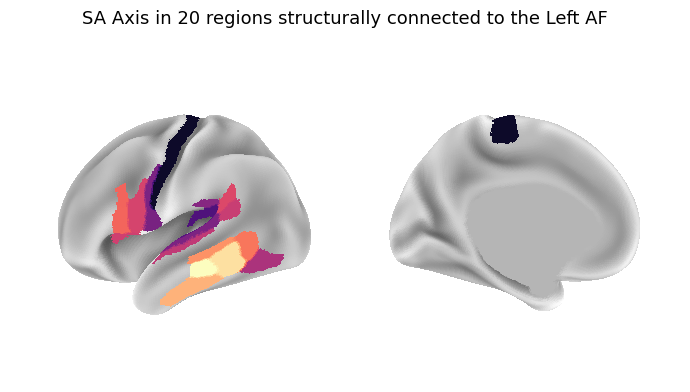

In [22]:
# plot static version of SA axis for brain regions structurally connected to the left AF
tractmaps_utils.plot_parc_subset(brain_map = sa_axis_glasser,
                                tract = 'AF_left',
                                connection_threshold = 0.95,
                                map_name = 'SA Axis',
                                tract_name = 'Left AF',
                                colors = 'magma',
                                mode = 'static')


Let's also display the corresponding tract (for now this is a jpg screenshot of the tract loaded in DSI Studio):

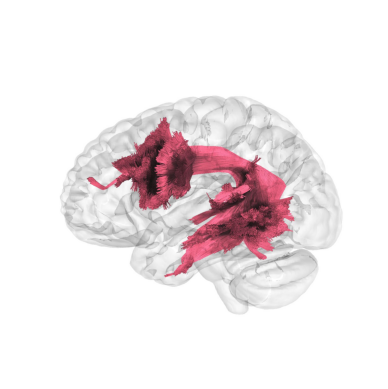

In [23]:
import matplotlib.pyplot as plt
from matplotlib import image as mpimg

# load tract image
tract_filepath='./tracts_figures/left_hem/0197_pnc_template.Arcuate_Fasciculus_L.jpg'
tract_img = mpimg.imread(tract_filepath)

# show plot
plt.axis('off')
plt.imshow(tract_img)


## 3. Test for statistical significance

How similar are structurally connected brain regions?

You might wonder if brain regions that are structurally connected to a given white matter tract might have similar cortical properties. For instance, maybe brain regions connected to the arcuate fasciculus are thicker and have more myelin (totally made up, probably not true!). 

### 3.1. Case study: zooming into the left arcuate fasciculus

Let's first work with an example. We'll define structurally connected vs non-connected regions for the left arcuate fasciculus, and compare intracortical myelin in connected vs non-connected regions using a two sample, two-tailed t-test. Next, we'll generate a null distribution of this by shuffling parcellated myelin values, yielding a new randomly assigned parcellated myelin map (we keep the same tract-to-region mapping). Then we do the t-test again. We do this 100 times to get a null distribution of differences between the two maps. We can then plot this against the empirically obtained map difference. 
If our hypothesis is correct, then we should find that structurally connected regions have significantly different myelin values compared to non-connected regions. 

#### Empirical test comparing map values in connected vs non-connected brain regions

First, let's compute the t-test examining the difference between parcellated myelin values of regions that are structurally connected vs non-connected to the left arcuate fasciculus. 

Note: I wonder if here we should only test against non-connected regions of the **same** hemisphere?

In [97]:
# load tract-to-region csv
tracts_regs_ids = pd.read_csv('./outputs/tracts_regs_Glasser.csv')

# select brain regions connected to the AF in most people (>95% probability of connection)
left_AF = tracts_regs_ids.loc[tracts_regs_ids['AF_left'] > 0.95, ['parcel_name', 'regionLongName', 'cortex', 'regionID']]
# print(f'Number of brain regions structurally connected to the left AF: {len(left_AF)}')

# select brain region indices
left_AF_idx = tracts_regs_ids.index[tracts_regs_ids['AF_left'] > 0.95].tolist()

# select all left hemisphere brain region indices
hem_all_idx = tracts_regs_ids.index[tracts_regs_ids['parcel_name'].str.contains('L_')].tolist()

# create array with map values of connected brain regions
connected = [myelin_glasser[i] for i in left_AF_idx]
print(f'Number of brain regions structurally connected to the left AF: {len(connected)}')

# create array with map values of non-connected regions
# non_connected = [myelin_glasser[i] for i in range(len(myelin_glasser)) if i not in left_AF_idx]

# create array with map values of non-connected regions of the SAME hemisphere as the tract  
non_connected = [myelin_glasser[i] for i in range(len(myelin_glasser)) if i not in left_AF_idx and i in hem_all_idx]
print(f'Number of brain regions NOT structurally connected to the left AF: {len(non_connected)}') 

# two sample two-tailed t-test to compare the difference of the two distributions (structurally connected vs non-connected regions)
from scipy.stats import ttest_ind
from statistics import mean

# In this case we have two sample arrays: structurally connected and non-connected regions
# Perform the t-test
empirical_t_statistic, empirical_p_value = ttest_ind(connected, non_connected)

# compute the difference in the means (will be used for plotting)
empirical_mean_diff = mean(connected) - mean(non_connected)

# Print the results
print("Empirical T-Statistic:", round(empirical_t_statistic, 3))
print("Empirical P-Value:", round(empirical_p_value, 3))
print("Empirical difference in means:", round(empirical_mean_diff, 3))

Number of brain regions structurally connected to the left AF: 20
Number of brain regions NOT structurally connected to the left AF: 160
Empirical T-Statistic: 0.417
Empirical P-Value: 0.677
Empirical difference in means: 0.012


#### Generate nulls

The next step is to generate a null distribution for this test by randomly shuffling the parcellated myelin map. Note that when doing significance testing, for non-connected regions we select only regions of the same hemisphere. 

To resolve: based on neuromaps' information, it's unclear whether spinning occurs on one hemisphere (and then gets mirrored on the other hemisphere). There is no 'hemisphere' argument in the `alexander_bloch` function. Here are some details from the Alexander-Bloch et al., 2018 NeuroImage paper: 

"For opposite hemispheres, the same rotations were applied about the left-right axis of rotation, while opposite (negative) rotations were applied about the superior-inferior axis and the anterior-posterior axis, in order to preserve the contralateral symmetry of the rotated maps." - based on this, it seems like it's being mirrored (?).

In [251]:
from scipy.stats import ttest_ind
from statistics import mean

# generate a null distribution by permuting the parcellated map (using neuromaps spatial nulls)
# this gives a new randomly assigned map values (for instance myelin) for each brain region
rotated_maps = nulls.alexander_bloch(myelin_glasser, atlas = 'fsLR', density = '32k',
                                n_perm = 100, seed = 1234, parcellation = glasser)
# print(rotated_maps.shape)
rotated_maps[:,2]

# null result lists
null_t_stats = []
null_p_vals = []
null_mean_diffs = []

# select brain region indices
left_AF_idx = tracts_regs_ids.index[tracts_regs_ids['AF_left'] > 0.95].tolist()

# select all left hemisphere brain region indices
hem_all_idx = tracts_regs_ids.index[tracts_regs_ids['parcel_name'].str.contains('L_')].tolist()

# loop over permuted brain maps
for map_index, rotated_map in enumerate(rotated_maps.T): # transposing to iterate through columns (i.e. maps)
    
    if map_index < 100: # loop until the 99th iteration, which corresponds to the 100th and last column
        
        # assign the brain regions as connected vs non-connected for each of the 100 permuted maps (columns), except now the map values have been shuffled
        # Note: this is assuming that only the values of the map are shuffled, while the index remains the same
        connected = [rotated_maps[i, map_index] for i in left_AF_idx]
        
        # subset non-connected brain regions
#         non_connected = [rotated_maps[i, map_index] for i in range(len(rotated_maps)) if i not in left_AF_idx]
       
        # subset only non-connected brain regions of the SAME hemisphere as the tract 
        non_connected = [rotated_maps[i, map_index] for i in range(len(rotated_maps)) if i not in left_AF_idx and i in hem_all_idx]
        
#         print(f'Number of brain regions structurally connected to the left AF: {len(connected)}') 
#         print(f'Number of brain regions NOT structurally connected to the left AF: {len(non_connected)}') 

        # two sample two-tailed t-test to compare the difference of the two distributions (structurally connected vs non-connected regions)
        t_statistic, p_value = ttest_ind(connected, non_connected)

        # compute the difference in the means (will be used for plotting)
        mean_diff = mean(connected) - mean(non_connected)

        # print the results
#         print(f'Map number: {map_index}')
#         print("T-Statistic:", round(t_statistic, 3))
#         print("P-Value:", round(p_value, 3))
#         print("Difference in means:", round(mean_diff, 3))

        # save the results
        null_t_stats.append(round(t_statistic, 3))
        null_p_vals.append(round(p_value, 3))
        null_mean_diffs.append(round(mean_diff, 3))

#### Visualize the results

Finally, let's plot the null distribution and the empirical result. See figure 2c in this paper: https://elifesciences.org/articles/62116

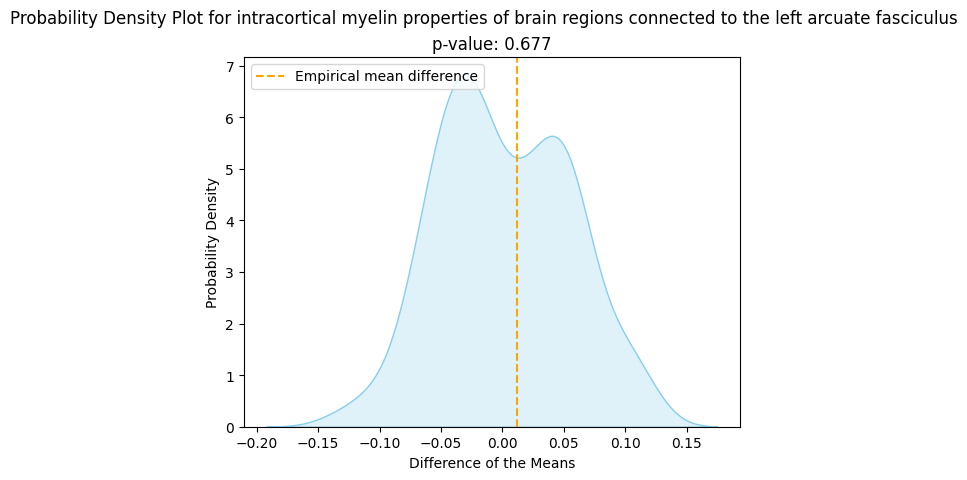

In [252]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Create a probability density plot using KDE
sns.kdeplot(null_mean_diffs, shade = True, color = 'skyblue')

# Add a vertical line at the empirical mean difference (i.e. for the non-rotated original map)
plt.axvline(x = empirical_mean_diff, color = 'orange', linestyle='--', label = 'Empirical mean difference')

# Add labels and title
plt.xlabel('Difference of the Means')
plt.ylabel('Probability Density')
plt.suptitle('Probability Density Plot for intracortical myelin properties of brain regions connected to the left arcuate fasciculus')
plt.title(f'p-value: {round(empirical_p_value, 3)}')
plt.legend()

# Show the plot
plt.show()

Note that the map values (myelin, in this case) have been standardized. 

### 3.2. Expand to all tracts and all maps

Now, let's do the same test but for all tracts and plot this - once collapsed across all tracts, and once as a grid displaying results per tract. 
We'll do this for every map we want to look at: S-A axis, cortical thickness, myelin and the first FC gradient.

In [40]:
import importlib
importlib.reload(tractmaps_utils)

<module 'tractmaps_utils' from '/Users/joelleba/neurohackademy/tractmaps/tractmaps_utils.py'>

In [41]:
# load tract-to-region csv
tracts_regs_ids = pd.read_csv('./outputs/tracts_regs_Glasser.csv')

# define white matter tracts to loop over 
tracts = tracts_regs_ids.filter(regex='left|right').columns

# remove the fornix ("F_") as this tract is connected to only 1 region (the hippocampus) and thus results in NA for the t-test
tracts = tracts[~tracts.isin(['F_left', 'F_right'])]

# all selected maps
maps_list = [sa_axis_glasser, thickness_glasser, fc_pc1_glasser, myelin_glasser]
map_names = ['sa_axis', 'thickness', 'fc_pc1', 'myelin']

# compute empirical results (from tractmaps_utils)
result_df = tractmaps_utils.compute_empirical(maps_list = maps_list, tracts = tracts, map_names = map_names, tracts_regs_ids = tracts_regs_ids)

# compute_nulls (from tractmaps_utils)
null_map_dict = tractmaps_utils.compute_nulls(maps_list = maps_list, tracts = tracts, map_names = map_names, tracts_regs_ids = tracts_regs_ids)


Running empirical testing for sa_axis...
Running empirical testing for thickness...
Running empirical testing for fc_pc1...
Running empirical testing for myelin...
Done!
Running nulls for sa_axis...
Running nulls for thickness...
Running nulls for fc_pc1...
Running nulls for myelin...
Done!


In [42]:
result_df

,tract_name,tract_size,cortical_map_mean,empirical_t_statistic,empirical_mean_diff,empirical_p_val,map_name,fdr_corrected_p_val
0,FAT_left,11,0.519,1.562,0.433,0.120,sa_axis,0.233010
1,AF_left,20,0.219,0.567,0.121,0.571,sa_axis,0.682143
2,PTAT_left,10,0.523,1.502,0.436,0.135,sa_axis,0.254717
3,MdLF_left,9,-0.314,-1.469,-0.448,0.143,sa_axis,0.257658
4,SLF_III_left,13,-0.472,-2.479,-0.630,0.014,sa_axis,0.048276
...,...,...,...,...,...,...,...,...
195,CStr_S_right,16,1.325,0.446,0.014,0.656,myelin,0.740449
196,CTh_A_right,12,1.202,-3.311,-0.118,0.001,myelin,0.006667
197,CTh_P_right,7,1.362,1.104,0.052,0.271,myelin,0.407519
198,CTh_S_right,8,1.331,0.449,0.020,0.654,myelin,0.740449


In [45]:
# Now, you can access the null DataFrames for each map in null_map_dict
for map_name, null_map_df in null_map_dict.items():
    print(f"Null Data for Map: {map_name}")
#     print(null_map_df.head)

Null Data for Map: sa_axis
Null Data for Map: thickness
Null Data for Map: fc_pc1
Null Data for Map: myelin


### 3.3. Does tract size (nb of connected regions) impact results?

Nope it doesn't:

Entire Dataset:
p-value for tract_size: 0.1990


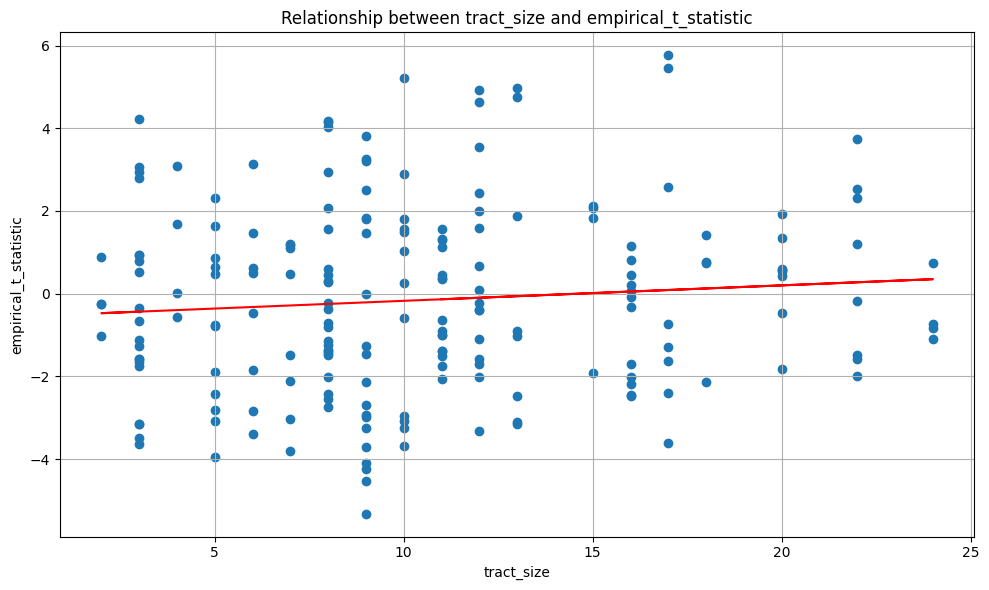

In [434]:
# across maps
run_linear_regression(df = result_df, 
                      x = 'tract_size', 
                      y = 'empirical_t_statistic', 
                      plot = True)

# # show by group
# run_linear_regression(df = result_df, 
#                       x = 'tract_size', 
#                       y = 'empirical_t_statistic', 
#                       separate_by_group = True, 
#                       group_column = 'map_name', 
#                       plot = True)

## 4. Visualize results

Now that we've tested for statistical significance, we can visualize the results in a couple of different ways: 

* Heatmaps: 
    + Heat map showing the mean cortical property value in structurally connected brain regions
    + Heat map showing the differences between structurally connected and non-connected brain regions (of the same hemisphere)
    + Heat map showing the effect size (t-value) of the differences between structurally connected and non-connected brain regions (of the same hemisphere)
    
   
* Cortical surface maps of structurally connected brain regions (showing the 4-5 maps that are most distinct to a given tract)
* Individual tract & map t-test results and corresponding null distribution plots


### 4.1. Heatmaps


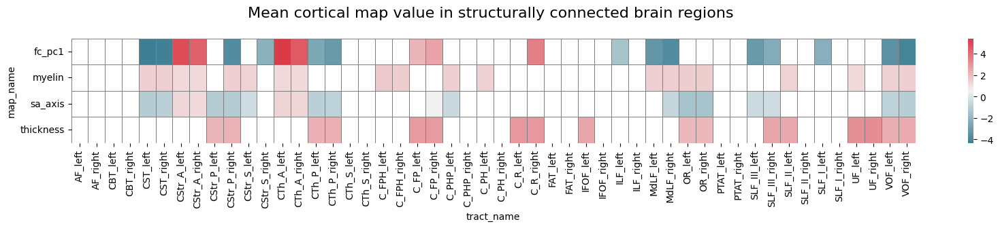

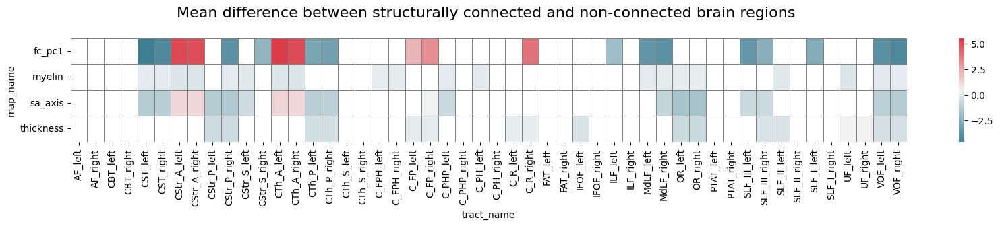

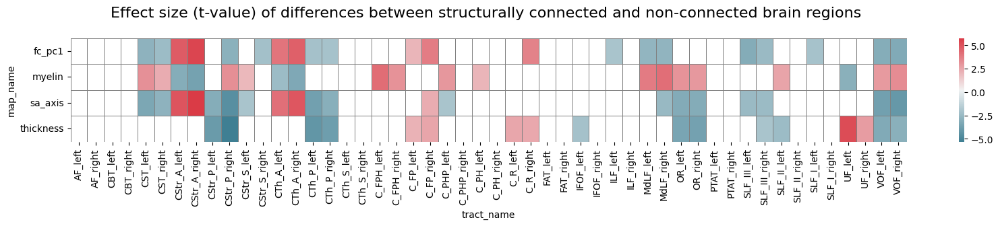

In [384]:
# mean cortical map value heatmap (generate_heatmap is from tractmaps_utils.py)
generate_heatmap(df = result_df, 
                 brain_maps_col = 'map_name', 
                 tracts_col = 'tract_name', 
                 result_value_col = 'cortical_map_mean', 
                 p_value_col = 'empirical_p_val', 
                 title = "Mean cortical map value in structurally connected brain regions \n")

# mean difference heatmap (generate_heatmap is from tractmaps_utils.py)
generate_heatmap(df = result_df, 
                 brain_maps_col = 'map_name', 
                 tracts_col = 'tract_name', 
                 result_value_col = 'empirical_mean_diff', 
                 p_value_col = 'empirical_p_val', 
                 title = "Mean difference between structurally connected and non-connected brain regions \n")

# t-values (~ effect size) heatmap (generate_heatmap is from tractmaps_utils.py)
generate_heatmap(df = result_df, 
                 brain_maps_col = 'map_name', 
                 tracts_col = 'tract_name', 
                 result_value_col = 'empirical_t_statistic', 
                 p_value_col = 'empirical_p_val', 
                 title = "Effect size (t-value) of differences between structurally connected and non-connected brain regions \n")

### 4.2. Tract-based query

Here, we're interested to know: what cortical maps are most strongly associated with a given tract?

To answer this question, we are sorting effect sizes (t-values) across all cortical maps. Then, we select the 3 cortical maps with the largest effect sizes (positive or negative), and display the map values in structurally connected regions, as well as the empirical result and null distribution.

Let's say we're interested in the right Corticostriatal Tract, Anterior Segment (CStr_A_right), as it's showing some pretty strong effect sizes.

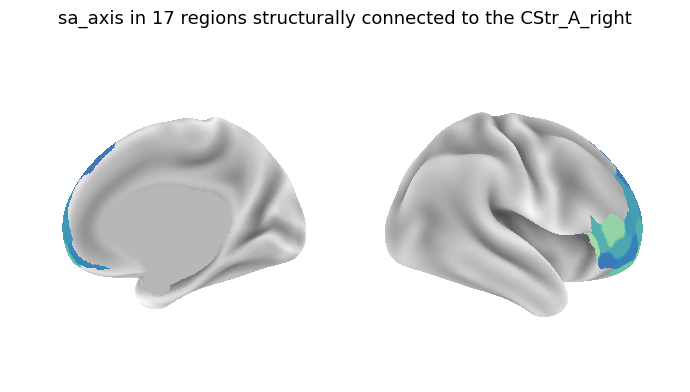

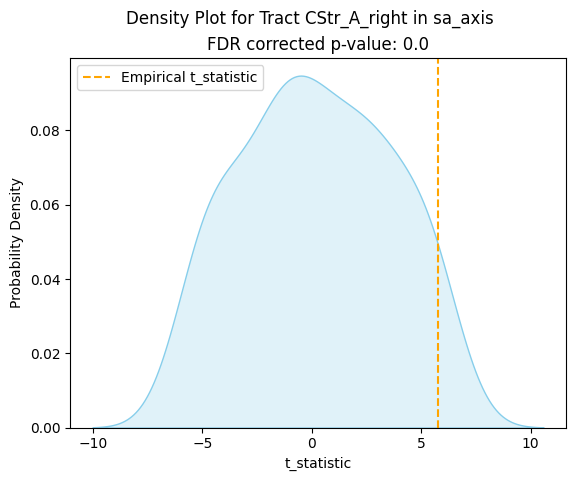

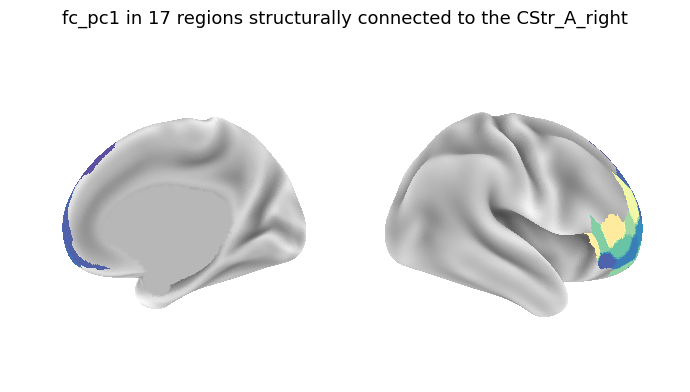

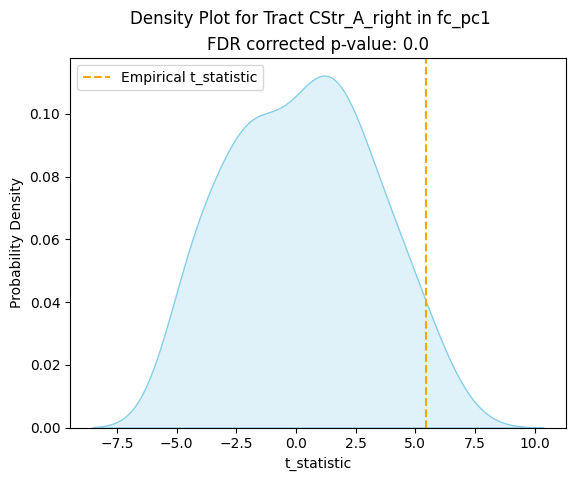

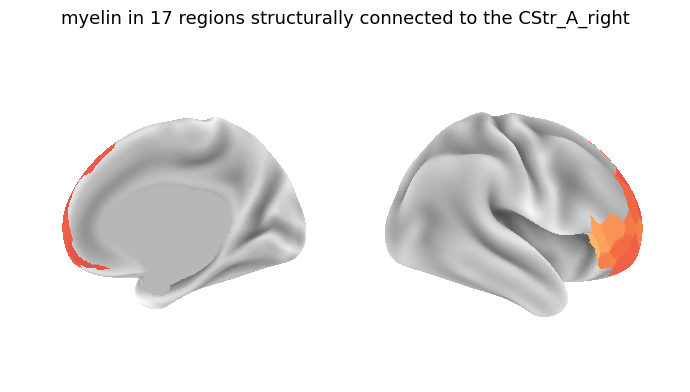

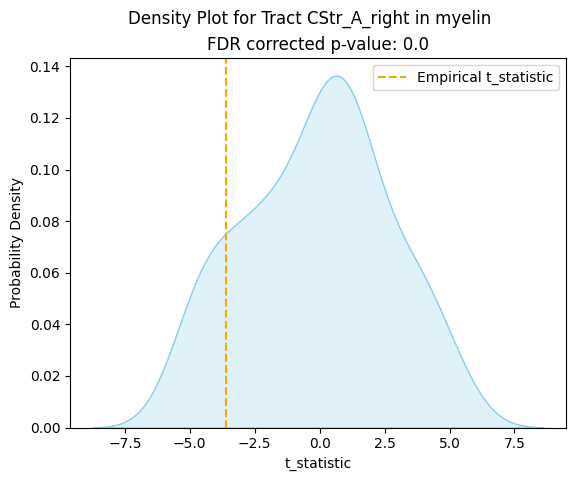

In [177]:
# tract of interest
tract = 'CStr_A_right'

# subset results for this tract
tract_results = result_df[result_df['tract_name'] == 'CStr_A_right']

# select 3 cortical maps with the largest effect sizes (regardless of sign)
tract_results['absolute_t_statistic'] = tract_results['empirical_t_statistic'].abs()
tract_results = tract_results.sort_values(by = 'absolute_t_statistic', ascending = False)

# Select the top 3 rows (3 largest absolute values)
top_3_largest = tract_results.head(3)

# create list of brain maps 
maps_to_plot = top_3_largest['map_name'].tolist()

# generate brain surface plot and empirical result & null distribution
for mp in maps_to_plot:
    map_name = f'{mp}_glasser'

    # brain map
    tractmaps_utils.plot_parc_subset(brain_map = locals()[map_name],
                                    tract = tract,
                                    connection_threshold = 0.95,
                                    map_name = f'{mp}',
                                    tract_name = f'{tract}',
                                    colors = 'Spectral',
                                    mode = 'static')
    
    # plot the null distribution and empirical value of tracts & maps of interest
    tractmaps_utils.plot_density(mp, tract, 't_statistic', 'skyblue')



### 4.3. Cortical map-based query

Here, we're interested to know: what tracts are most strongly associated with a given cortical map?

To answer this question, we are sorting effect sizes (t-values) across all tracts for that specific map. Then, we select the 3 tracts with the largest effect sizes (positive or negative), and display the map values in structurally connected regions, as well as the empirical result and null distribution.

Let's say we're interested in the cortical thickness map.

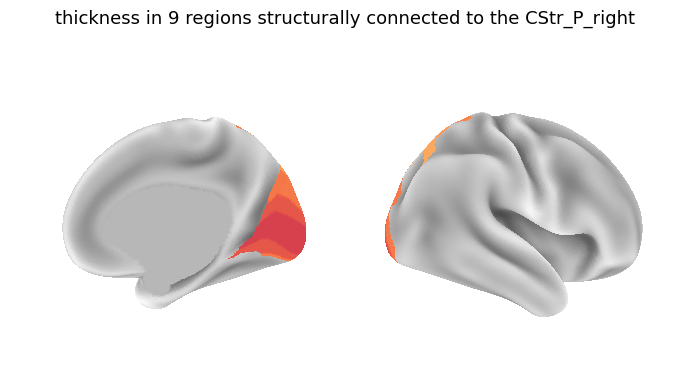

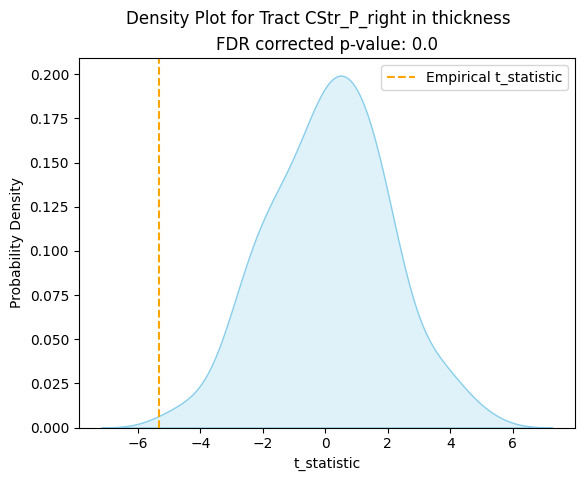

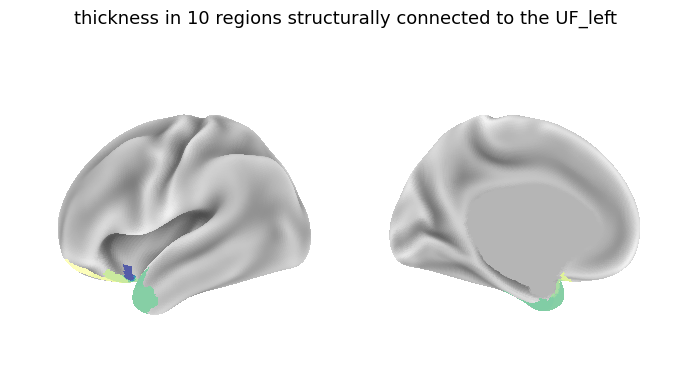

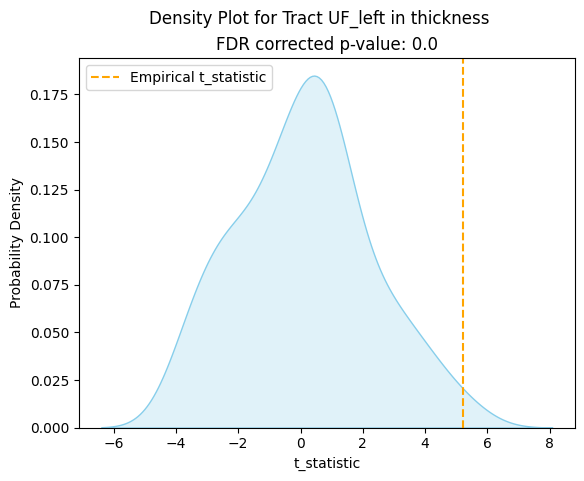

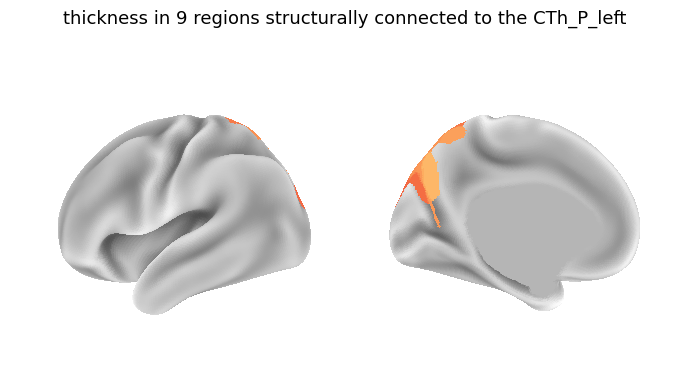

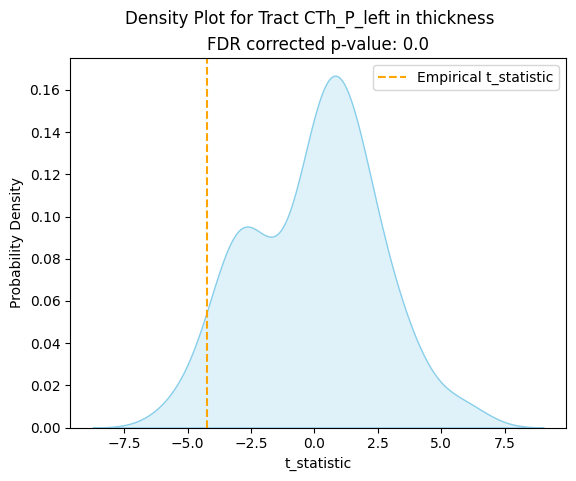

In [187]:
# tract of interest
brain_map = 'thickness'

# subset results for this tract
tract_results = result_df[result_df['map_name'] == f'{brain_map}']

# select 3 tracts with the largest effect sizes (regardless of sign)
tract_results['absolute_t_statistic'] = tract_results['empirical_t_statistic'].abs()
tract_results = tract_results.sort_values(by = 'absolute_t_statistic', ascending = False)

# Select the top 3 rows (3 largest absolute values)
top_3_largest = tract_results.head(3)

# create list of brain maps 
tracts_to_plot = top_3_largest['tract_name'].tolist()

# generate brain surface plot and empirical result & null distribution
for tract in tracts_to_plot:

    # brain map
    tractmaps_utils.plot_parc_subset(brain_map = locals()[f'{brain_map}_glasser'],
                                    tract = tract,
                                    connection_threshold = 0.95,
                                    map_name = f'{brain_map}',
                                    tract_name = f'{tract}',
                                    colors = 'Spectral',
                                    mode = 'static')
    
    # plot the null distribution and empirical value of tracts & maps of interest
    tractmaps_utils.plot_density(brain_map, tract, 't_statistic', 'skyblue')

